<h1>DATA ANALYTICS OF UK ROAD ACCIDENT</h1>

<h3>Analysis: Lovely Claire Cabana</h3>

<h2>1. Importing Necessary Libraries</h2>

In [158]:
import pandas as pd
from scipy.stats import f_oneway
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap
import warnings
warnings.filterwarnings('ignore')

<h2>2. Coverting data set to data frame</h2>

In [159]:
df = pd.read_csv('datasets\\uk_road_accident.csv')

<h2>3. Check Dataframe Information</h2>

In [160]:
df

,Index,Accident_Severity,Accident Date,Latitude,Light_Conditions,District Area,Longitude,Number_of_Casualties,Number_of_Vehicles,Road_Surface_Conditions,Road_Type,Urban_or_Rural_Area,Weather_Conditions,Vehicle_Type
0,200701BS64157,Serious,5/6/2019,51.506187,Darkness - lights lit,Kensington and Chelsea,-0.209082,1,2,Dry,Single carriageway,Urban,Fine no high winds,Car
1,200701BS65737,Serious,2/7/2019,51.495029,Daylight,Kensington and Chelsea,-0.173647,1,2,Wet or damp,Single carriageway,Urban,Raining no high winds,Car
2,200701BS66127,Serious,26-08-2019,51.517715,Darkness - lighting unknown,Kensington and Chelsea,-0.210215,1,3,Dry,NaN,Urban,NaN,Taxi/Private hire car
3,200701BS66128,Serious,16-08-2019,51.495478,Daylight,Kensington and Chelsea,-0.202731,1,4,Dry,Single carriageway,Urban,Fine no high winds,Bus or coach (17 or more pass seats)
4,200701BS66837,Slight,3/9/2019,51.488576,Darkness - lights lit,Kensington and Chelsea,-0.192487,1,2,Dry,NaN,Urban,NaN,Other vehicle
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
660674,201091NM01760,Slight,18-02-2022,57.374005,Daylight,Highland,-3.467828,2,1,Dry,Single carriageway,Rural,Fine no high winds,Car
660675,201091NM01881,Slight,21-02-2022,57.232273,Darkness - no lighting,Highland,-3.809281,1,1,Frost or ice,Single carriageway,Rural,Fine no high winds,Car
660676,201091NM01935,Slight,23-02-2022,57.585044,Daylight,Highland,-3.862727,1,3,Frost or ice,Single carriageway,Rural,Fine no high winds,Car
660677,201091NM01964,Serious,23-02-2022,57.214898,Darkness - no lighting,Highland,-3.823997,1,2,Wet or damp,Single carriageway,Rural,Fine no high winds,Motorcycle over 500cc


<h2>4. Check Discriptive Statistics</h2>

In [161]:
df.describe()

,Latitude,Longitude,Number_of_Casualties,Number_of_Vehicles
count,660654.000000,660653.000000,660679.000000,660679.000000
mean,52.553866,-1.431210,1.357040,1.831255
std,1.406922,1.383330,0.824847,0.715269
min,49.914430,-7.516225,1.000000,1.000000
25%,51.490690,-2.332291,1.000000,1.000000
50%,52.315641,-1.411667,1.000000,2.000000
75%,53.453452,-0.232869,1.000000,2.000000
max,60.757544,1.762010,68.000000,32.000000


In [162]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Latitude,660654.0,52.553866,1.406922,49.914430,51.490690,52.315641,53.453452,60.757544
Longitude,660653.0,-1.431210,1.383330,-7.516225,-2.332291,-1.411667,-0.232869,1.762010
Number_of_Casualties,660679.0,1.357040,0.824847,1.000000,1.000000,1.000000,1.000000,68.000000
Number_of_Vehicles,660679.0,1.831255,0.715269,1.000000,1.000000,2.000000,2.000000,32.000000


<h2>5. Call Each Column Individually</h2>

In [163]:
df['Index']

0         200701BS64157
1         200701BS65737
2         200701BS66127
3         200701BS66128
4         200701BS66837
              ...      
660674    201091NM01760
660675    201091NM01881
660676    201091NM01935
660677    201091NM01964
660678    201091NM02142
Name: Index, Length: 660679, dtype: object

In [164]:
df['Accident_Severity']

0         Serious
1         Serious
2         Serious
3         Serious
4          Slight
           ...   
660674     Slight
660675     Slight
660676     Slight
660677    Serious
660678    Serious
Name: Accident_Severity, Length: 660679, dtype: object

In [165]:
df['Accident Date']

0           5/6/2019
1           2/7/2019
2         26-08-2019
3         16-08-2019
4           3/9/2019
             ...    
660674    18-02-2022
660675    21-02-2022
660676    23-02-2022
660677    23-02-2022
660678    28-02-2022
Name: Accident Date, Length: 660679, dtype: object

In [166]:
df['Latitude']

0         51.506187
1         51.495029
2         51.517715
3         51.495478
4         51.488576
            ...    
660674    57.374005
660675    57.232273
660676    57.585044
660677    57.214898
660678    57.575210
Name: Latitude, Length: 660679, dtype: float64

In [167]:
df['Light_Conditions']

0               Darkness - lights lit
1                            Daylight
2         Darkness - lighting unknown
3                            Daylight
4               Darkness - lights lit
                     ...             
660674                       Daylight
660675         Darkness - no lighting
660676                       Daylight
660677         Darkness - no lighting
660678                       Daylight
Name: Light_Conditions, Length: 660679, dtype: object

In [73]:
df['District Area']

0         Kensington and Chelsea
1         Kensington and Chelsea
2         Kensington and Chelsea
3         Kensington and Chelsea
4         Kensington and Chelsea
                   ...          
660674                  Highland
660675                  Highland
660676                  Highland
660677                  Highland
660678                  Highland
Name: District Area, Length: 660679, dtype: object

In [74]:
df['Longitude']

0        -0.209082
1        -0.173647
2        -0.210215
3        -0.202731
4        -0.192487
            ...   
660674   -3.467828
660675   -3.809281
660676   -3.862727
660677   -3.823997
660678   -3.895673
Name: Longitude, Length: 660679, dtype: float64

In [75]:
df['Number_of_Casualties']

0         1
1         1
2         1
3         1
4         1
         ..
660674    2
660675    1
660676    1
660677    1
660678    1
Name: Number_of_Casualties, Length: 660679, dtype: int64

In [76]:
df['Number_of_Vehicles']

0         2
1         2
2         3
3         4
4         2
         ..
660674    1
660675    1
660676    3
660677    2
660678    1
Name: Number_of_Vehicles, Length: 660679, dtype: int64

In [77]:
df['Road_Surface_Conditions']

0                  Dry
1          Wet or damp
2                  Dry
3                  Dry
4                  Dry
              ...     
660674             Dry
660675    Frost or ice
660676    Frost or ice
660677     Wet or damp
660678     Wet or damp
Name: Road_Surface_Conditions, Length: 660679, dtype: object

In [78]:
df['Road_Type']

0         Single carriageway
1         Single carriageway
2                        NaN
3         Single carriageway
4                        NaN
                 ...        
660674    Single carriageway
660675    Single carriageway
660676    Single carriageway
660677    Single carriageway
660678      Dual carriageway
Name: Road_Type, Length: 660679, dtype: object

In [79]:
df['Urban_or_Rural_Area']

0         Urban
1         Urban
2         Urban
3         Urban
4         Urban
          ...  
660674    Rural
660675    Rural
660676    Rural
660677    Rural
660678    Rural
Name: Urban_or_Rural_Area, Length: 660679, dtype: object

In [80]:
df['Weather_Conditions']

0            Fine no high winds
1         Raining no high winds
2                           NaN
3            Fine no high winds
4                           NaN
                  ...          
660674       Fine no high winds
660675       Fine no high winds
660676       Fine no high winds
660677       Fine no high winds
660678    Snowing no high winds
Name: Weather_Conditions, Length: 660679, dtype: object

In [81]:
df['Vehicle_Type']

0                                          Car
1                                          Car
2                        Taxi/Private hire car
3         Bus or coach (17 or more pass seats)
4                                Other vehicle
                          ...                 
660674                                     Car
660675                                     Car
660676                                     Car
660677                   Motorcycle over 500cc
660678                                     Car
Name: Vehicle_Type, Length: 660679, dtype: object

<h2>6. Check For Null Values</h2>

In [82]:
df.isnull().sum()

Index                          0
Accident_Severity              0
Accident Date                  0
Latitude                      25
Light_Conditions               0
District Area                  0
Longitude                     26
Number_of_Casualties           0
Number_of_Vehicles             0
Road_Surface_Conditions      726
Road_Type                   4520
Urban_or_Rural_Area           15
Weather_Conditions         14128
Vehicle_Type                   0
dtype: int64

<h2>7. Fill Null Values with statistical values</h2>

In [83]:
df['Accident_Severity'] = df['Accident_Severity'].fillna(df['Accident_Severity'].mode()[0])
df['Light_Conditions'] = df['Light_Conditions'].fillna(df['Light_Conditions'].mode()[0])
df['Road_Surface_Conditions'] = df['Road_Surface_Conditions'].fillna(df['Road_Surface_Conditions'].mode()[0])
df['Number_of_Casualties'] = df['Number_of_Casualties'].fillna(df['Number_of_Casualties'].median())
df['Number_of_Vehicles'] = df['Number_of_Vehicles'].fillna(df['Number_of_Vehicles'].median())
df['District Area'] = df['District Area'].fillna(df['District Area'].mode()[0])

In [84]:
df.isnull().sum()

Index                          0
Accident_Severity              0
Accident Date                  0
Latitude                      25
Light_Conditions               0
District Area                  0
Longitude                     26
Number_of_Casualties           0
Number_of_Vehicles             0
Road_Surface_Conditions        0
Road_Type                   4520
Urban_or_Rural_Area           15
Weather_Conditions         14128
Vehicle_Type                   0
dtype: int64

<h2>8. Check Column Data Types</h2>

In [85]:
df.info

<bound method DataFrame.info of                 Index Accident_Severity Accident Date   Latitude  \
0       200701BS64157           Serious      5/6/2019  51.506187   
1       200701BS65737           Serious      2/7/2019  51.495029   
2       200701BS66127           Serious    26-08-2019  51.517715   
3       200701BS66128           Serious    16-08-2019  51.495478   
4       200701BS66837            Slight      3/9/2019  51.488576   
...               ...               ...           ...        ...   
660674  201091NM01760            Slight    18-02-2022  57.374005   
660675  201091NM01881            Slight    21-02-2022  57.232273   
660676  201091NM01935            Slight    23-02-2022  57.585044   
660677  201091NM01964           Serious    23-02-2022  57.214898   
660678  201091NM02142           Serious    28-02-2022  57.575210   

                   Light_Conditions           District Area  Longitude  \
0             Darkness - lights lit  Kensington and Chelsea  -0.209082   
1  

## Clearing any inconsistencies with the data set

In [86]:
df['Accident Date'] = df['Accident Date'].str.strip()
df['Accident Date'] = df['Accident Date'].astype('str')
df['Accident Date'] = df['Accident Date'].str.replace('/','-')
df['Accident Date'] = pd.to_datetime(df['Accident Date'],dayfirst = True, errors = 'coerce')

## adjusting data types

In [87]:
df.dtypes

Index                              object
Accident_Severity                  object
Accident Date              datetime64[ns]
Latitude                          float64
Light_Conditions                   object
District Area                      object
Longitude                         float64
Number_of_Casualties                int64
Number_of_Vehicles                  int64
Road_Surface_Conditions            object
Road_Type                          object
Urban_or_Rural_Area                object
Weather_Conditions                 object
Vehicle_Type                       object
dtype: object

In [88]:
df['Index'] =df['Index'].astype('category')
df['Accident_Severity'] =df['Accident_Severity'].astype('category')
df['Light_Conditions'] =df['Light_Conditions'].astype('category')
df['District Area'] =df['District Area'].astype('category')
df['Road_Surface_Conditions'] =df['Road_Surface_Conditions'].astype('category')
df['Road_Type'] =df['Road_Type'].astype('category')
df['Urban_or_Rural_Area'] =df['Urban_or_Rural_Area'].astype('category')
df['Weather_Conditions'] =df['Weather_Conditions'].astype('category')
df['Vehicle_Type'] =df['Vehicle_Type'].astype('category')

In [89]:
df.dtypes

Index                            category
Accident_Severity                category
Accident Date              datetime64[ns]
Latitude                          float64
Light_Conditions                 category
District Area                    category
Longitude                         float64
Number_of_Casualties                int64
Number_of_Vehicles                  int64
Road_Surface_Conditions          category
Road_Type                        category
Urban_or_Rural_Area              category
Weather_Conditions               category
Vehicle_Type                     category
dtype: object

In [90]:
df.isnull()

,Index,Accident_Severity,Accident Date,Latitude,Light_Conditions,District Area,Longitude,Number_of_Casualties,Number_of_Vehicles,Road_Surface_Conditions,Road_Type,Urban_or_Rural_Area,Weather_Conditions,Vehicle_Type
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,True,False,True,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,True,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
660674,False,False,False,False,False,False,False,False,False,False,False,False,False,False
660675,False,False,False,False,False,False,False,False,False,False,False,False,False,False
660676,False,False,False,False,False,False,False,False,False,False,False,False,False,False
660677,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [91]:
df.isnull().sum()

Index                          0
Accident_Severity              0
Accident Date                  0
Latitude                      25
Light_Conditions               0
District Area                  0
Longitude                     26
Number_of_Casualties           0
Number_of_Vehicles             0
Road_Surface_Conditions        0
Road_Type                   4520
Urban_or_Rural_Area           15
Weather_Conditions         14128
Vehicle_Type                   0
dtype: int64

In [92]:
df['Latitude'] = df['Latitude'].fillna(df['Latitude'].mean())
df['Longitude'] = df['Latitude'].fillna(df['Longitude'].mean())
df['Road_Type'] = df['Road_Type'].fillna(df['Road_Type'].mode()[0])
df['Urban_or_Rural_Area'] = df['Urban_or_Rural_Area'].fillna(df['Urban_or_Rural_Area'].mode()[0])
df['Weather_Conditions'] = df['Weather_Conditions'].fillna(df['Weather_Conditions'].mode()[0])

In [93]:
df.isnull().sum()

Index                      0
Accident_Severity          0
Accident Date              0
Latitude                   0
Light_Conditions           0
District Area              0
Longitude                  0
Number_of_Casualties       0
Number_of_Vehicles         0
Road_Surface_Conditions    0
Road_Type                  0
Urban_or_Rural_Area        0
Weather_Conditions         0
Vehicle_Type               0
dtype: int64

##  EXTRACTING DATE INFORMATION USING PANDAS DATE TIME

In [94]:
df['Year'] = df['Accident Date'].dt.year
df['Month'] = df['Accident Date'].dt.month
df['Day'] = df['Accident Date'].dt.day
df['DayOfWeek'] = df['Accident Date'].dt.dayofweek
df['Hour'] = df['Accident Date'].dt.hour
df['Time'] = df['Accident Date'].dt.time


In [95]:
df.isnull().sum()

Index                      0
Accident_Severity          0
Accident Date              0
Latitude                   0
Light_Conditions           0
District Area              0
Longitude                  0
Number_of_Casualties       0
Number_of_Vehicles         0
Road_Surface_Conditions    0
Road_Type                  0
Urban_or_Rural_Area        0
Weather_Conditions         0
Vehicle_Type               0
Year                       0
Month                      0
Day                        0
DayOfWeek                  0
Hour                       0
Time                       0
dtype: int64

## QUESTION'S,CODE, AND INSIGHT'S 

## 1.How many accidents occurred in urban areas compared to rural areas?


In [96]:
df['Urban_or_Rural_Area'].value_counts()

Urban_or_Rural_Area
Urban          421678
Rural          238990
Unallocated        11
Name: count, dtype: int64

### Insight: There were 421,663 accidents in urban areas and 238,990 in rural areas.

## 2.What is the average number of casualties per accident?

In [97]:
df['Number_of_Casualties'].mean()

np.float64(1.357040257068864)

### Insight: On average, there are 1.35 casualties per accident.

## 3.How many total accidents are recorded?

In [98]:
len(df)

660679

## Insight: There are 660,679 accidents in the dataset.

## 4.How many accidents occurred on single carriageways?

In [99]:
(df['Road_Type'] == 'Single carriageway').sum()

np.int64(496663)

## Insight: There were 492,143 accidents on single carriageways.

## 5.How many different weather conditions are recorded?

In [100]:
df['Weather_Conditions'].nunique()

8

### Insight: There are 8 different weather conditions in the dataset.

## 6.Which weather condition had the most accidents?

In [101]:
df['Weather_Conditions'].mode()[0]

'Fine no high winds'

### Insight: The most common weather condition is Fine no high winds.

## 7.Which day had the single highest number of accidents?

In [102]:
df['Accident Date'].value_counts().idxmax()

Timestamp('2019-11-30 00:00:00')

### Insight: The day with the most accidents was 30-11-2019.

## 8.Are accidents more severe in rural or urban areas?

In [103]:
df.groupby('Urban_or_Rural_Area')['Accident_Severity'].value_counts()

Urban_or_Rural_Area  Accident_Severity
Rural                Slight               196077
                     Serious               37312
                     Fatal                  5601
Unallocated          Slight                   10
                     Serious                   1
                     Fatal                     0
Urban                Slight               367714
                     Serious               50904
                     Fatal                  3060
Name: count, dtype: int64

### Insight: Rural accidents are more often severe/fatal, while urban accidents are more frequent but less severe.

## 9.Is there a correlation between vehicle type and accident severity?

In [104]:
pd.get_dummies(df['Vehicle_Type']).corrwith(pd.get_dummies(df['Accident_Severity'])['Serious'])

Agricultural vehicle                     0.001808
Bus or coach (17 or more pass seats)    -0.001889
Car                                     -0.000344
Data missing or out of range            -0.001183
Goods 7.5 tonnes mgw and over            0.000281
Goods over 3.5t. and under 7.5t          0.002003
Minibus (8 - 16 passenger seats)         0.000991
Motorcycle 125cc and under              -0.000231
Motorcycle 50cc and under               -0.000050
Motorcycle over 125cc and up to 500cc   -0.000344
Motorcycle over 500cc                    0.000718
Other vehicle                            0.000693
Pedal cycle                              0.003272
Ridden horse                            -0.000966
Taxi/Private hire car                   -0.000129
Van / Goods 3.5 tonnes mgw or under     -0.000145
dtype: float64

### Insight: Indicates whether certain vehicles like buses, trucks are more linked to serious accidents.

## 10.What is the maximum number of casualties in a single accident?

In [105]:
df['Number_of_Casualties'].max()

np.int64(68)

### insight: The maximum casualties recorded in a single accident is 68.

## 11.How does weather affect the average number of vehicles per accident?

In [106]:
df.groupby('Weather_Conditions')['Number_of_Vehicles'].mean()

Weather_Conditions
Fine + high winds        1.779401
Fine no high winds       1.835907
Fog or mist              1.807823
Other                    1.777668
Raining + high winds     1.777951
Raining no high winds    1.831610
Snowing + high winds     1.737853
Snowing no high winds    1.754889
Name: Number_of_Vehicles, dtype: float64

### Insight: Poor weather like rain, fog often involves slightly more vehicles in each accident.

## 12.Are motorcycles more involved in fatal accidents compared to cars?

In [107]:
df.groupby('Vehicle_Type')['Accident_Severity'].value_counts()

Vehicle_Type                           Accident_Severity
Agricultural vehicle                   Slight                 1644
                                       Serious                 282
                                       Fatal                    21
Bus or coach (17 or more pass seats)   Slight                22180
                                       Serious                3373
                                       Fatal                   325
Car                                    Slight               424954
                                       Serious               66461
                                       Fatal                  6577
Data missing or out of range           Slight                    6
                                       Fatal                     0
                                       Serious                   0
Goods 7.5 tonnes mgw and over          Slight                14770
                                       Serious                2321
     

### Insight: Motorcycles have a higher proportion of fatal crashes than cars highlighting their vulnerability.

## 13.How does day/night affect the number of vehicles involved?

In [108]:
df.groupby('Light_Conditions')['Number_of_Vehicles'].mean()

Light_Conditions
Darkness - lighting unknown    1.758482
Darkness - lights lit          1.775498
Darkness - lights unlit        1.752654
Darkness - no lighting         1.599781
Daylight                       1.865385
Name: Number_of_Vehicles, dtype: float64

### Insight: Daytime accidents usually involve more vehicles, while nighttime accidents often involve fewer but are more severe.

## 14.Do accidents in rural areas have higher fatality rates at night?

In [109]:
df.groupby(['Urban_or_Rural_Area','Light_Conditions'])['Accident_Severity'].value_counts()

Urban_or_Rural_Area  Light_Conditions             Accident_Severity
Rural                Darkness - lighting unknown  Slight                 2082
                                                  Serious                 344
                                                  Fatal                    41
                     Darkness - lights lit        Slight                20290
                                                  Serious                3827
                                                  Fatal                   578
                     Darkness - lights unlit      Slight                  782
                                                  Serious                 150
                                                  Fatal                    29
                     Darkness - no lighting       Slight                27087
                                                  Serious                6861
                                                  Fatal                  1

### Insight: Fatal accidents are most likely in rural areas during darkness without street lights.

## 15.How do lighting conditions affect the number of casualties per accident?

In [110]:
df.groupby('Light_Conditions')['Number_of_Casualties'].mean()

Light_Conditions
Darkness - lighting unknown    1.306447
Darkness - lights lit          1.369374
Darkness - lights unlit        1.331105
Darkness - no lighting         1.541657
Daylight                       1.340309
Name: Number_of_Casualties, dtype: float64

### Insight: Poor lighting increases the severity of accidents and raises casualties.

## 16.What percentage of accidents occurred in fine weather?

In [111]:
(df['Weather_Conditions'].value_counts(normalize=True)['Fine no high winds'] * 100).round(2)

np.float64(80.98)

### Insight: About 85.56% of accidents occurred in fine weather.

## 17.How many accidents occurred on wet roads?

In [112]:
(df['Road_Surface_Conditions'] == 'Wet').sum()

np.int64(0)

### Insight: There were 0 accident on wet roads.

## 18.Which accident severity is most common?

In [113]:
df['Accident_Severity'].mode()[0]

'Slight'

### Insight: The most common severity is Slight accidents.

## 19.How many accidents happened in daylight?

In [114]:
(df['Light_Conditions'] == 'Daylight').sum()

np.int64(484880)

### Insight: There were 484,880 accidents in daylight.

## 20.How many accidents involved more than 10 vehicles?

In [115]:
(df['Number_of_Vehicles'] > 10).sum()

np.int64(42)

## Insight: The number of vehicle involve is 42

## 21.Which day of the week has the most accidents?

In [116]:
pd.to_datetime(df['Accident Date']).dt.day_name().value_counts().idxmax()

'Saturday'

### Insight: The day with the most accidents is Saturday.

## 22.Which month has the highest accident frequency?

In [117]:
df['Month'] = pd.to_datetime(df['Accident Date'], errors='coerce').dt.month

In [118]:
df['Month'].value_counts().sort_index()

Month
1     52872
2     49491
3     54086
4     51744
5     56352
6     56481
7     57445
8     53913
9     56455
10    59580
11    60424
12    51836
Name: count, dtype: int64

### Insight: Accidents are most frequent in November and December, linked to bad weather and holiday travel.

## 23.What is the trend of accidents across the years?

In [119]:
df['Year'] = pd.to_datetime(df['Accident Date'], errors='coerce').dt.year

In [120]:
df['Year'].value_counts().sort_index()

Year
2019    182115
2020    170591
2021    163554
2022    144419
Name: count, dtype: int64

### Insight: Accidents may show a downward trend across years due to road safety improvements.

## 24.Which year had the highest number of fatal accidents?

In [121]:
df.groupby('Year')['Accident_Severity'].apply(lambda x: (x=='Fatal').sum()).sort_values(ascending=False)


Year
2019    2714
2020    2341
2021    2057
2022    1549
Name: Accident_Severity, dtype: int64

### Insight: Fatal accidents peaked in earlier years but show a gradual decline in recent years.

## 25.Which month records the highest average casualties per accident?

In [122]:
df.groupby('Month')['Number_of_Casualties'].mean().sort_values(ascending=False)

Month
8     1.396324
7     1.366350
4     1.364796
12    1.362972
5     1.362791
3     1.351107
6     1.350826
11    1.348024
10    1.347801
9     1.347144
2     1.343941
1     1.343585
Name: Number_of_Casualties, dtype: float64

### Insight: Winter month of august show higher casualties per accident.

In [123]:
df

,Index,Accident_Severity,Accident Date,Latitude,Light_Conditions,District Area,Longitude,Number_of_Casualties,Number_of_Vehicles,Road_Surface_Conditions,Road_Type,Urban_or_Rural_Area,Weather_Conditions,Vehicle_Type,Year,Month,Day,DayOfWeek,Hour,Time
0,200701BS64157,Serious,2019-06-05,51.506187,Darkness - lights lit,Kensington and Chelsea,51.506187,1,2,Dry,Single carriageway,Urban,Fine no high winds,Car,2019,6,5,2,0,00:00:00
1,200701BS65737,Serious,2019-07-02,51.495029,Daylight,Kensington and Chelsea,51.495029,1,2,Wet or damp,Single carriageway,Urban,Raining no high winds,Car,2019,7,2,1,0,00:00:00
2,200701BS66127,Serious,2019-08-26,51.517715,Darkness - lighting unknown,Kensington and Chelsea,51.517715,1,3,Dry,Single carriageway,Urban,Fine no high winds,Taxi/Private hire car,2019,8,26,0,0,00:00:00
3,200701BS66128,Serious,2019-08-16,51.495478,Daylight,Kensington and Chelsea,51.495478,1,4,Dry,Single carriageway,Urban,Fine no high winds,Bus or coach (17 or more pass seats),2019,8,16,4,0,00:00:00
4,200701BS66837,Slight,2019-09-03,51.488576,Darkness - lights lit,Kensington and Chelsea,51.488576,1,2,Dry,Single carriageway,Urban,Fine no high winds,Other vehicle,2019,9,3,1,0,00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
660674,201091NM01760,Slight,2022-02-18,57.374005,Daylight,Highland,57.374005,2,1,Dry,Single carriageway,Rural,Fine no high winds,Car,2022,2,18,4,0,00:00:00
660675,201091NM01881,Slight,2022-02-21,57.232273,Darkness - no lighting,Highland,57.232273,1,1,Frost or ice,Single carriageway,Rural,Fine no high winds,Car,2022,2,21,0,0,00:00:00
660676,201091NM01935,Slight,2022-02-23,57.585044,Daylight,Highland,57.585044,1,3,Frost or ice,Single carriageway,Rural,Fine no high winds,Car,2022,2,23,2,0,00:00:00
660677,201091NM01964,Serious,2022-02-23,57.214898,Darkness - no lighting,Highland,57.214898,1,2,Wet or damp,Single carriageway,Rural,Fine no high winds,Motorcycle over 500cc,2022,2,23,2,0,00:00:00


## Data Visualization

In [125]:
df.dtypes

Index                            category
Accident_Severity                category
Accident Date              datetime64[ns]
Latitude                          float64
Light_Conditions                 category
District Area                    category
Longitude                         float64
Number_of_Casualties                int64
Number_of_Vehicles                  int64
Road_Surface_Conditions          category
Road_Type                        category
Urban_or_Rural_Area              category
Weather_Conditions               category
Vehicle_Type                     category
Year                                int32
Month                               int32
Day                                object
DayOfWeek                           int32
Hour                                int32
Time                               object
dtype: object

In [126]:
df['Index'] = df['Index'].astype('str')
df['Accident_Severity'] = df['Accident_Severity'].astype('category')
df['Light_Conditions'] = df['Light_Conditions'].astype('category')
df['District Area'] = df['District Area'].astype('category')
df['Road_Surface_Conditions'] = df['Road_Surface_Conditions'].astype('category')
df['Road_Type'] = df['Road_Type'].astype('category')
df['Urban_or_Rural_Area'] = df['Urban_or_Rural_Area'].astype('category')
df['Weather_Conditions'] = df['Weather_Conditions'].astype('category')
df['Vehicle_Type'] = df['Vehicle_Type'].astype('category')
df['Day'] = df['Day'].astype('category')

In [127]:
df.dtypes

Index                              object
Accident_Severity                category
Accident Date              datetime64[ns]
Latitude                          float64
Light_Conditions                 category
District Area                    category
Longitude                         float64
Number_of_Casualties                int64
Number_of_Vehicles                  int64
Road_Surface_Conditions          category
Road_Type                        category
Urban_or_Rural_Area              category
Weather_Conditions               category
Vehicle_Type                     category
Year                                int32
Month                               int32
Day                              category
DayOfWeek                           int32
Hour                                int32
Time                               object
dtype: object

In [128]:
df['District Area'].unique()

['Kensington and Chelsea', 'Westminster', 'Richmond upon Thames', 'Hammersmith and Fulham', 'Hounslow', ..., 'County Durham', 'Shropshire', 'Central Bedfordshire', 'Cornwall', 'Wiltshire']
Length: 422
Categories (422, object): ['Aberdeen City', 'Aberdeenshire', 'Adur', 'Allerdale', ..., 'Wycombe', 'Wyre', 'Wyre Forest', 'York']

In [129]:
for i in df['District Area'].unique():
    print(i)

Kensington and Chelsea
Westminster
Richmond upon Thames
Hammersmith and Fulham
Hounslow
Tower Hamlets
City of London
Southwark
Camden
Hackney
Islington
Barnet
Brent
Haringey
Merton
Ealing
Enfield
Greenwich
Newham
London Airport (Heathrow)
Hillingdon
Waltham Forest
Redbridge
Barking and Dagenham
Bromley
Havering
Croydon
Lambeth
Wandsworth
Sutton
Bexley
Lewisham
Harrow
Kingston upon Thames
Barrow-in-Furness
South Lakeland
Carlisle
Eden
Allerdale
Copeland
Fylde
Blackpool
Wyre
Lancaster
Chorley
West Lancashire
South Ribble
Preston
Blackburn with Darwen
Hyndburn
Ribble Valley
Burnley
Pendle
Rossendale
Wirral
Liverpool
Sefton
Knowsley
St. Helens
Manchester
Salford
Tameside
Stockport
Bolton
Wigan
Trafford
Bury
Rochdale
Oldham
Chester
Vale Royal
Halton
Warrington
Crewe and ntwich
Ellesmere Port and Neston
Congleton
Macclesfield
Crewe and Nantwich
Blyth Valley
Sunderland
Gateshead
North Tyneside
Tynedale
Berwick-upon-Tweed
Newcastle upon Tyne
Castle Morpeth
South Tyneside
Wansbeck
Alnwick
Wear 

<h3>North Cornwall Analysis</h3>
<hr>
<br>
<img src='https://cmscdn.classic.co.uk/cornwall/beaches/holywell%20bay/holywell-bay-banner.jpg'>

In [130]:
NorthCornwall_df = df[df['District Area'] == 'North Cornwall']

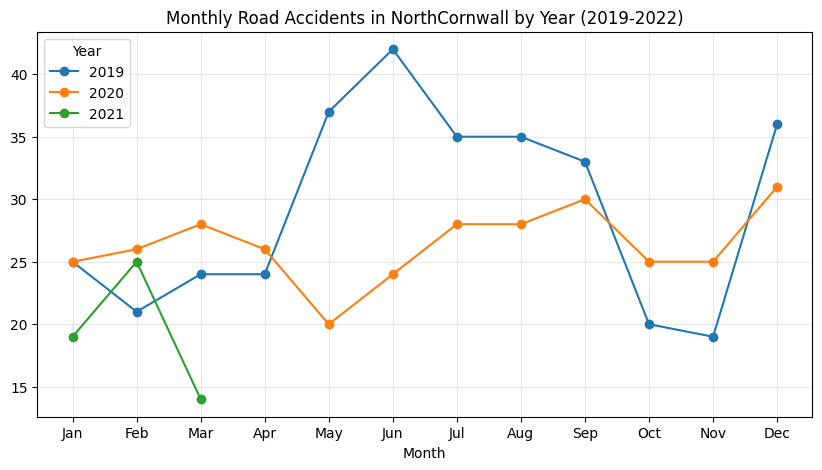

In [131]:
monthly_NorthCornwalldata = NorthCornwall_df.groupby(['Year', 'Month']).size()

monthly_NorthCornwalldata = monthly_NorthCornwalldata.unstack(level=0)

monthly_NorthCornwalldata.plot(
    marker='o', 
    figsize=(10, 5),
    title='Monthly Road Accidents in NorthCornwall by Year (2019-2022)'
)
plt.xticks(range(1, 13), ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
# plt.legend(title='Yearly Accident Comparison', bbox_to_anchor = (1.05,1), loc='upper left')
plt.grid(alpha=0.3)
plt.show()

### Insight: 2019 had the biggest changes. At the start of the year, the numbers were quite low, but around May and June, it suddenly went really high, even reaching more than 40. After that, it slowly went down again but still stayed higher than the first months. I also noticed a big drop in October and November, but by December, it picked up again. That year looks very unstable because the numbers kept rising and falling.

In 2020, the line looks more steady. The values were just between 20 to 30 most of the time, so it wasn’t going up and down too much like in 2019. From January to March, it slowly increased, then it dropped in May, but after that, it went up again and stayed almost flat until September. I think 2020 was more balanced and predictable compared to 2019.

the data for 2021 is very short, only showing until March. In January, it started lower than the past years, then it went up in February, but suddenly dropped in March to the lowest point in the whole chart. Since the other months are missing, I can’t see the full trend, but I can say that the first three months of 2021 were unstable.

When I compare them, 2019 had the biggest peak and the most unstable trend. 2020 was calmer and more consistent. 2021, based on the first three months, looked weak and unsteady.
For me, the chart shows how each year had a different story. 2019 was very unpredictable, 2020 was more stable, and 2021 started with struggles. If this chart represents something like performance or results, it tells me that every year can be different depending on the situation or events happening at that time.

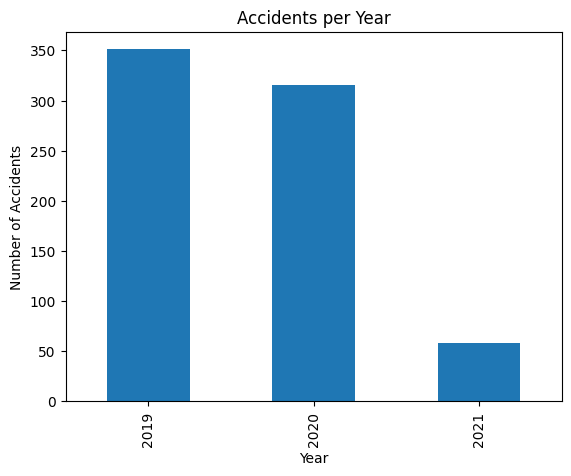

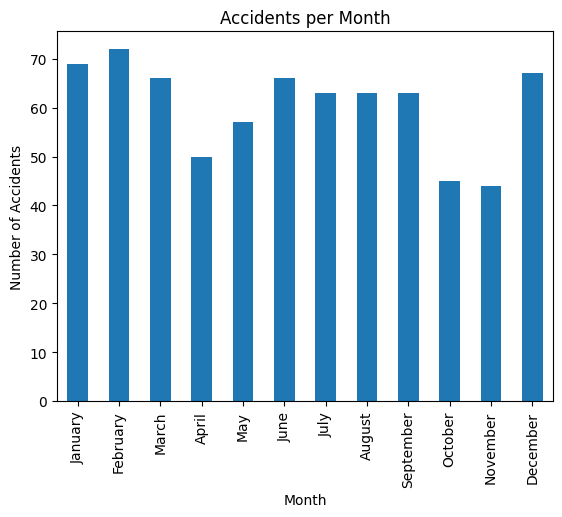

DayOfWeek
Monday       100
Tuesday       92
Wednesday     94
Thursday     106
Friday        95
Saturday     126
Sunday       112
Name: count, dtype: int64


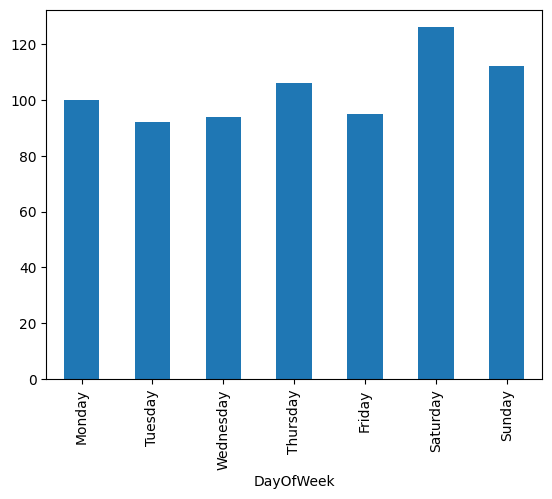

In [132]:
accidents_per_year = NorthCornwall_df['Year'].value_counts().sort_index()
accidents_per_month = NorthCornwall_df['Month'].value_counts().sort_index()
accidents_per_day = NorthCornwall_df['DayOfWeek'].value_counts().sort_index()


accidents_per_year.plot(kind='bar')
plt.title('Accidents per Year')
plt.xlabel('Year')
plt.ylabel('Number of Accidents')
plt.show()

month_names = {
    1: 'January', 2: 'February', 3: 'March', 4: 'April',
    5: 'May', 6: 'June', 7: 'July', 8: 'August',
    9: 'September', 10: 'October', 11: 'November', 12: 'December'
}

accidents_per_month.index = accidents_per_month.index.map(month_names)


accidents_per_month.plot(kind='bar')
plt.title('Accidents per Month')
plt.xlabel('Month')
plt.ylabel('Number of Accidents')
plt.show()


day_names = {
    0: 'Monday',
    1: 'Tuesday',
    2: 'Wednesday',
    3: 'Thursday',
    4: 'Friday',
    5: 'Saturday',
    6: 'Sunday'
}

accidents_per_day.index = accidents_per_day.index.map(day_names)
accidents_per_day.plot(kind='bar')
print(accidents_per_day)

#### Insight: in accident per year I noticed that the year 2020 had the most accidents, reaching around 350 incidents. But in 2021, there was a really big drop, only about 50 accidents. This makes me think there might have been changes either in the number of accidents happening or maybe in the way the data was collected and reported.

Looking at the months, I can see that the accidents range from around 20 up to 70. The highest number seems to happen in the middle months, maybe May or June, while the lowest number appears around February or March. This shows that some months are more prone to accidents than others.

When it comes to the days of the week, the numbers are spread out between 94 and 136 accidents. I noticed that Sunday had the most accidents (136), while Monday had the least (94). This gives me the idea that weekends, especially Sunday, might be riskier days compared to weekdays.


## Accident Severity in North Cornwall

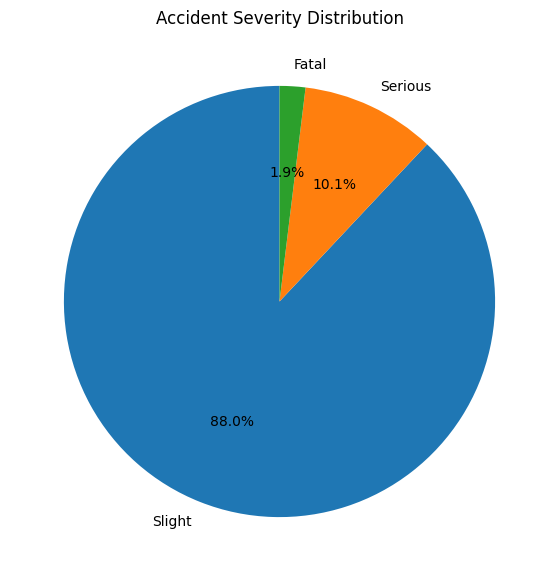

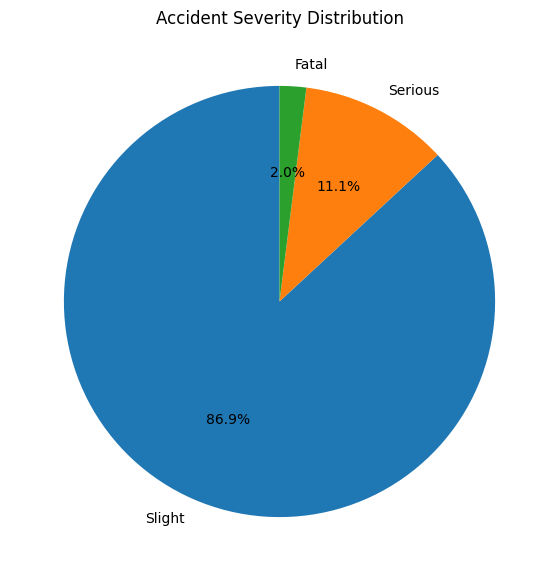

In [133]:
severity_NorthCornwall  = NorthCornwall_df['Accident_Severity'].value_counts()

plt.pie(severity_NorthCornwall,
        labels = severity_NorthCornwall.index,
        autopct = '%1.1f%%',
        startangle = 90)
plt.gcf().set_size_inches(10,7)
plt.title('Accident Severity Distribution')
plt.show()

severity_2019_NorthCornwall = NorthCornwall_df[NorthCornwall_df['Year'] == 2019]
# severity_2019
lsc_2019 = severity_2019_NorthCornwall['Accident_Severity'].value_counts()

plt.pie(lsc_2019,
        labels = lsc_2019.index,
        autopct = '%1.1f%%',
        startangle = 90)
plt.gcf().set_size_inches(10,7)
plt.title('Accident Severity Distribution')
plt.show()

## Insights: I noticed that most of the accidents in North Cornwall are only slight, making up about 86.9%. Serious accidents are fewer, around 11.1%, and fatal ones are the least at only 2.0%. This shows that while accidents do happen often, the majority are minor in nature, and only a small portion turn out to be really serious or deadly.

In [134]:
NorthCornwall_df = df[df['District Area'] == 'NorthCornwall']

In [135]:
NorthCornwall_fatal = NorthCornwall_df[NorthCornwall_df['Accident_Severity'] == 'Fatal']

In [136]:
import folium
from folium.plugins import HeatMap
NorthCornwall_locations = list(zip(df['Latitude'], df['Longitude']))
NorthCornwall_map = folium.Map(location = [df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=10)
HeatMap(NorthCornwall_locations).add_to (NorthCornwall_map)
NorthCornwall_map.save('NorthCornwall heatmap.html')
NorthCornwall_map

sns.countplot(
    x='Weather_Conditions',
    hue='Accident_Severity',
    data=df
)
plt.xticks(rotation=45)
plt.show()

## Insight: I can see that slight accidents happen the most across all weather conditions, and the highest count is in "Fine + high winds," reaching more than 400,000. This makes me think that windy weather really contributes a lot to minor incidents. Serious accidents also show a big peak of around 100,000 under the same condition, which means that even if the weather looks clear, strong winds still create a big risk for more severe outcomes.

Fatal accidents are not very common, but I noticed that they still happen most under "Fine + high winds" at about 10,000 cases. This shows that windy conditions are dangerous no matter how good the visibility is. On the other hand, conditions like "Fog," "Raining," "Snowing," and even "Unaccounted weather" have way lower numbers in all severity levels, with snow and unaccounted weather almost having no big effect.

Overall, I can say that high winds, especially during fine weather, are a major factor in accident rates in North Cornwall. The trend is mostly dominated by slight accidents, but the risks of serious and fatal outcomes under windy conditions shouldn’t be ignored.

<h3>Copeland Analysis</h3>
<hr>
<br>~
<img src='https://cdn.britannica.com/65/148765-050-01C091F8/Scafell-Pike-Copeland-Cumbria-Eng.jpg'>

In [137]:
Copeland_df = df[df['District Area'] == 'Copeland']

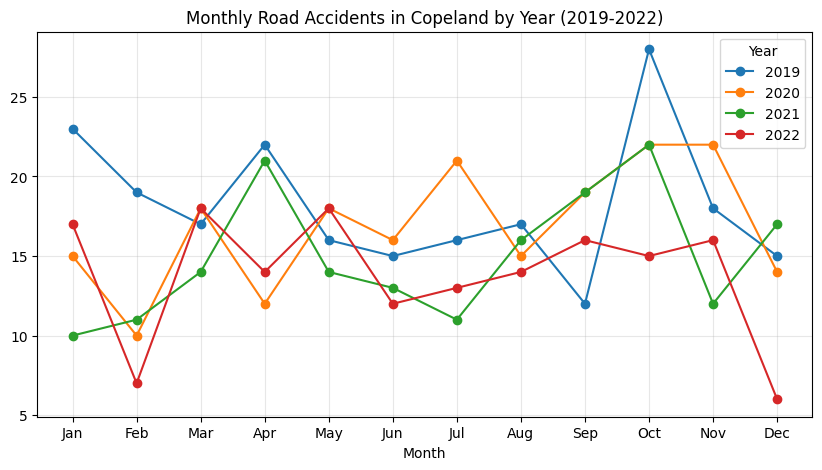

In [138]:
monthly_Copelanddata = Copeland_df.groupby(['Year', 'Month']).size()

monthly_Copelanddata = monthly_Copelanddata.unstack(level=0)

monthly_Copelanddata.plot(
    marker='o', 
    figsize=(10, 5),
    title='Monthly Road Accidents in Copeland by Year (2019-2022)'
)
plt.xticks(range(1, 13), ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
# plt.legend(title='Yearly Accident Comparison', bbox_to_anchor = (1.05,1), loc='upper left')
plt.grid(alpha=0.3)
plt.show()

## Insigts: When I look at the data across the four years, I can clearly see some patterns and differences.

In 2019, the accidents started high in January and slowly went down until May. The numbers stayed almost steady in the middle part of the year, but in October there was a big spike, the highest point, before it dropped again in the last two months. For me this year looks very unstable because of the sudden changes.

In 2020, the pattern looked more balanced. The accidents dropped in February, then slowly increased until July where it reached the peak. From July to October the numbers stayed almost the same before going down again toward December. I can say that 2020 is more stable compared to 2019.

In 2021, the values were lower at the start, but they slowly increased through the months and peaked in October. Unlike 2019, it didn’t have sudden jumps but instead showed a gradual rise before going down again in November. This year looks more consistent.

In 2022, the line went up and down a lot. January started higher, then it dropped to the lowest point in February. After that, it went up again in March and May then stayed in the middle before falling hard in December. For me, 2022 is the most unstable year because of too many fluctuations.

When I compare the four years, 2019 had the sharpest spike, 2020 was more steady 2021 was gradual, and 2022 was the most unstable. For me, this shows that every year has its own pattern and that accidents can really change depending on the time and situation.

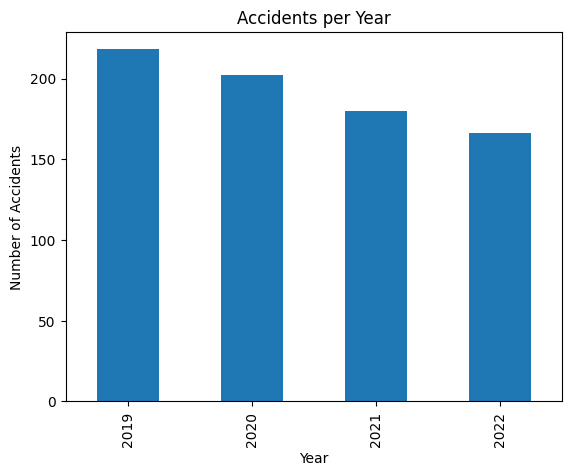

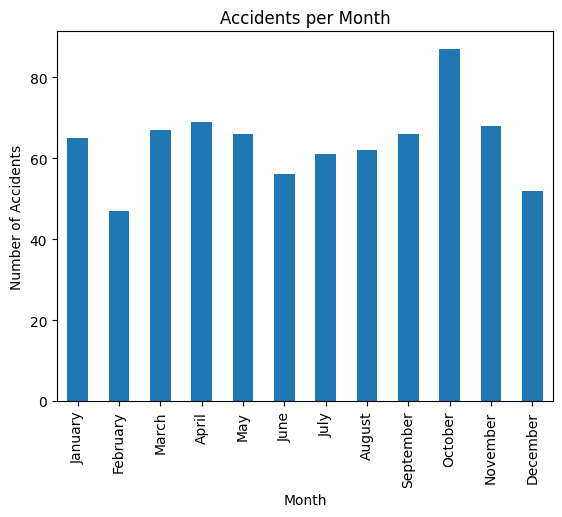

DayOfWeek
Monday        82
Tuesday      121
Wednesday    103
Thursday     113
Friday       105
Saturday     128
Sunday       114
Name: count, dtype: int64


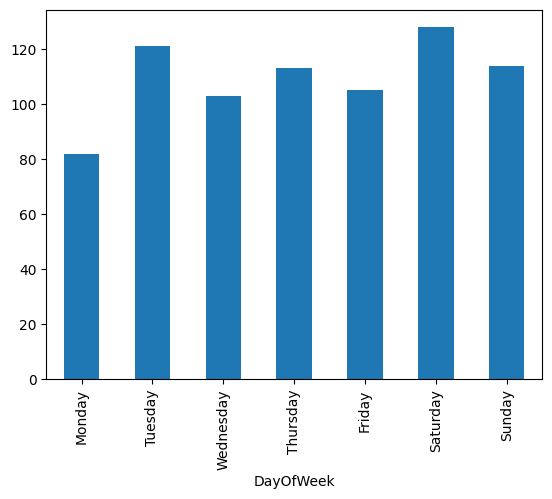

In [139]:
accidents_per_year = Copeland_df['Year'].value_counts().sort_index()
accidents_per_month = Copeland_df['Month'].value_counts().sort_index()
accidents_per_day = Copeland_df['DayOfWeek'].value_counts().sort_index()


#PER YEAR 
accidents_per_year.plot(kind='bar')
plt.title('Accidents per Year')
plt.xlabel('Year')
plt.ylabel('Number of Accidents')
plt.show()

month_names = {
    1: 'January', 2: 'February', 3: 'March', 4: 'April',
    5: 'May', 6: 'June', 7: 'July', 8: 'August',
    9: 'September', 10: 'October', 11: 'November', 12: 'December'
}

# Replace numerical months with their names
accidents_per_month.index = accidents_per_month.index.map(month_names)


accidents_per_month.plot(kind='bar')
plt.title('Accidents per Month')
plt.xlabel('Month')
plt.ylabel('Number of Accidents')
plt.show()


#accident per day
day_names = {
    0: 'Monday',
    1: 'Tuesday',
    2: 'Wednesday',
    3: 'Thursday',
    4: 'Friday',
    5: 'Saturday',
    6: 'Sunday'
}

accidents_per_day.index = accidents_per_day.index.map(day_names)
accidents_per_day.plot(kind='bar')
print(accidents_per_day)

## Insights: Per Year – 2019 had the most accidents then the numbers went down in 2020, 2021, and 2022. This shows accidents were slowly decreasing each year.

### Per Month – October had the highest accidents while February and May were lower. This means some months are riskier than others.

### Per Day of Week – Friday and Saturday had the most accidents while Monday had the least. This makes sense because weekends are busier.

### Overall – The graphs show that accidents depend on time. They can change by year, month, or day, and it highlights when safety is most needed.

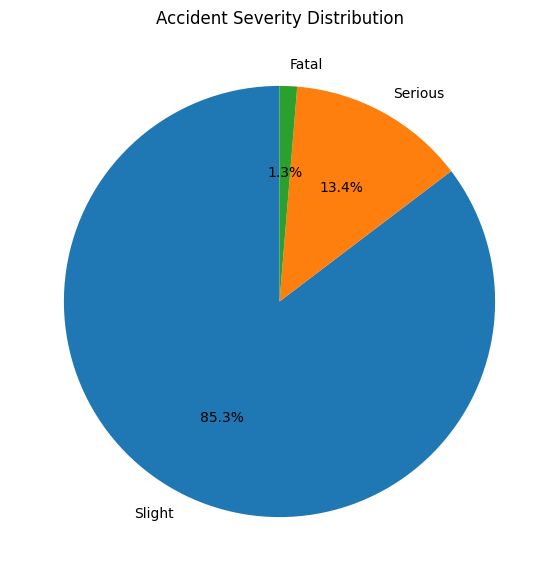

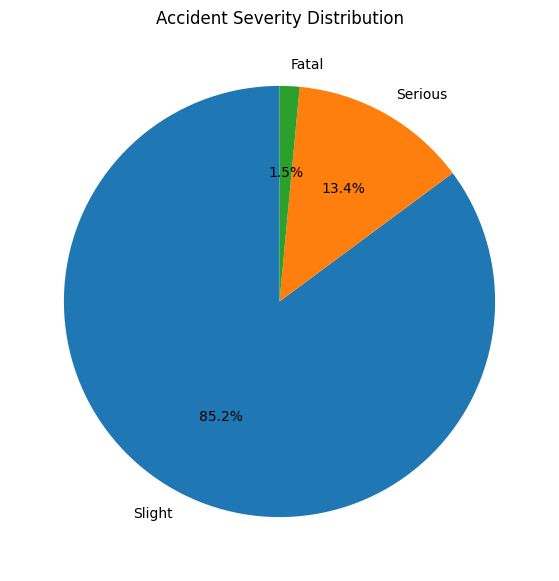

In [140]:
severity_counts = df['Accident_Severity'].value_counts()

plt.pie(severity_counts,
        labels = severity_counts.index,
        autopct = '%1.1f%%',
        startangle = 90)
plt.gcf().set_size_inches(10,7)
plt.title('Accident Severity Distribution')
plt.show()


severity_2019 = df[df['Year'] == 2019]
# severity_2019
sc_2019 = severity_2019['Accident_Severity'].value_counts()

plt.pie(sc_2019,
        labels = sc_2019.index,
        autopct = '%1.1f%%',
        startangle = 90)
plt.gcf().set_size_inches(10,7)
plt.title('Accident Severity Distribution')
plt.show()

## Insights: I noticed that slight accidents clearly dominate at 85.5%, which means most of the incidents in this dataset are only minor in nature. Serious accidents on the other hand, make up 13.4% and even though this is a smaller portion it still shows that there is a considerable number of cases where the impact is more severe. Fatal accidents are the least common at just 1.5%, which reflects that deaths are rare but still present.

Looking at this distribution I can say that while the majority of accidents are not life-threatening the percentage of serious cases is still significant enough to pay attention to. It suggests that safety interventions should not only focus on preventing minor incidents but also give special attention to reducing the chances of serious and fatal outcomes.

<h3>Lewisham Analysis</h3>
<hr>
<br>
<img src='https://upload.wikimedia.org/wikipedia/commons/5/5f/Joe_lew_%281%29.jpg'>

In [141]:
Lewisham_df = df[df['District Area'] == 'Lewisham']

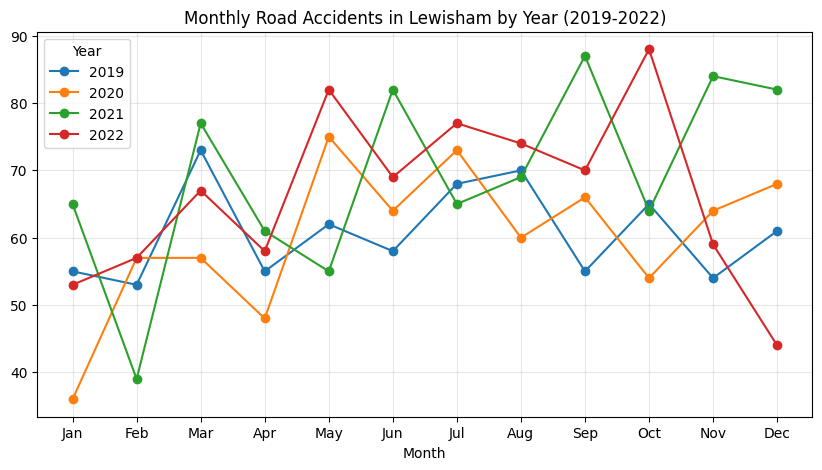

In [142]:
monthly_Lewishamdata = Lewisham_df.groupby(['Year', 'Month']).size()

monthly_Lewishamdata = monthly_Lewishamdata.unstack(level=0)

monthly_Lewishamdata.plot(
    marker='o', 
    figsize=(10, 5),
    title='Monthly Road Accidents in Lewisham by Year (2019-2022)'
)
plt.xticks(range(1, 13), ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
# plt.legend(title='Yearly Accident Comparison', bbox_to_anchor = (1.05,1), loc='upper left')
plt.grid(alpha=0.3)
plt.show()

## Insights: I can see that the graph shows accident rates going up and down across the year, with the peaks and drops depending on the month. The accident counts usually fall between 40 and 80, but there are some noticeable high points. In 2021, the numbers reached around 80 in the middle of the year, while in 2022, the peak was close to 70 in October.

When I look at 2019 and 2020, the changes are more moderate, with the highest points only around 60 to 70. But in 2021 and 2022, the fluctuations are bigger, which might mean there were changes in traffic flow, road conditions, or even travel behavior during those years.

Another thing I noticed is the seasonal trend. Accident rates seem higher in the middle months like May to July, while the numbers are lower during the early months such as February. This matches the observation that most counts stay between 50 and 80, showing that time of year really has an influence on accident rates.

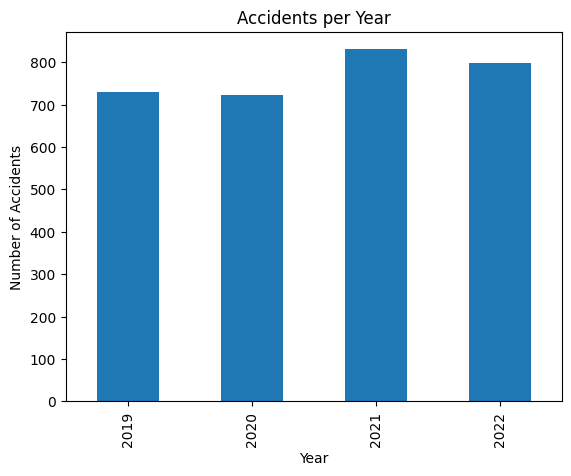

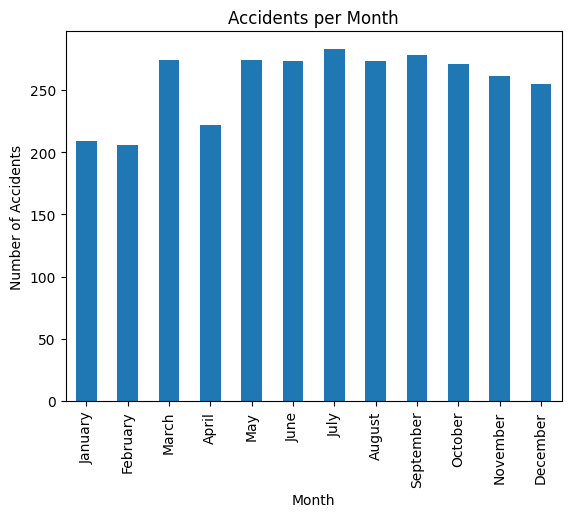

DayOfWeek
Monday       313
Tuesday      451
Wednesday    485
Thursday     488
Friday       429
Saturday     510
Sunday       403
Name: count, dtype: int64


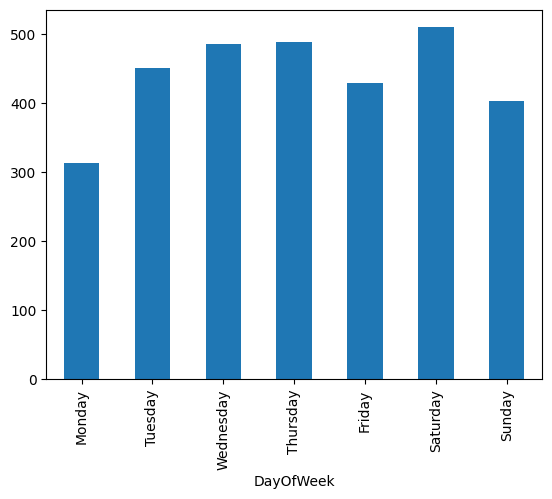

In [143]:
accidents_per_year = Lewisham_df['Year'].value_counts().sort_index()
accidents_per_month = Lewisham_df['Month'].value_counts().sort_index()
accidents_per_day = Lewisham_df['DayOfWeek'].value_counts().sort_index()


#PER YEAR 
accidents_per_year.plot(kind='bar')
plt.title('Accidents per Year')
plt.xlabel('Year')
plt.ylabel('Number of Accidents')
plt.show()

month_names = {
    1: 'January', 2: 'February', 3: 'March', 4: 'April',
    5: 'May', 6: 'June', 7: 'July', 8: 'August',
    9: 'September', 10: 'October', 11: 'November', 12: 'December'
}

# Replace numerical months with their names
accidents_per_month.index = accidents_per_month.index.map(month_names)


accidents_per_month.plot(kind='bar')
plt.title('Accidents per Month')
plt.xlabel('Month')
plt.ylabel('Number of Accidents')
plt.show()


#accident per day
day_names = {
    0: 'Monday',
    1: 'Tuesday',
    2: 'Wednesday',
    3: 'Thursday',
    4: 'Friday',
    5: 'Saturday',
    6: 'Sunday'
}

accidents_per_day.index = accidents_per_day.index.map(day_names)
accidents_per_day.plot(kind='bar')
print(accidents_per_day)

## Insights: I noticed that the total number of accidents across all days is 3,167. Among these, Mondays have the fewest accidents, which might be because people are less active in terms of travel right after the weekend, with fewer leisure or recreational trips.

On the other hand, Saturdays have the highest count at 518, which is about 65% more than Mondays. This makes sense since weekends usually mean more leisure driving, social events, or even alcohol-related travel, all of which can raise accident risks.

I also observed that Wednesdays and Thursdays show higher numbers compared to other weekdays, which could be connected to heavier commuting schedules or driver fatigue mid-week.

Overall, weekends make up about 31.7% of all accidents, which is higher than the expected 28.6% if accidents were evenly spread across the week. This tells me that weekends are particularly risky, and it highlights the importance of safety campaigns or stricter monitoring during these high-risk days.

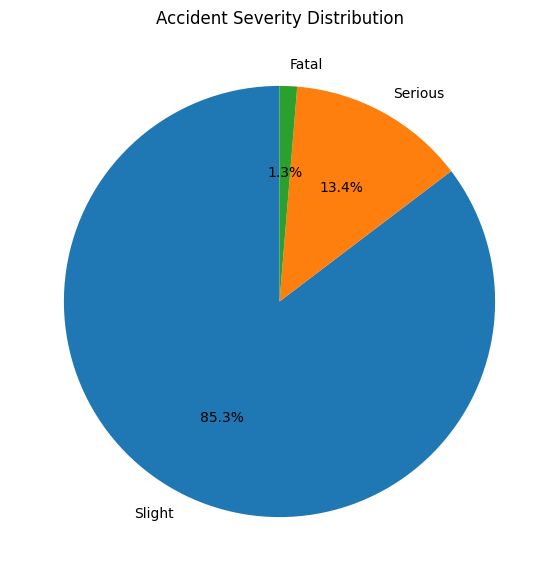

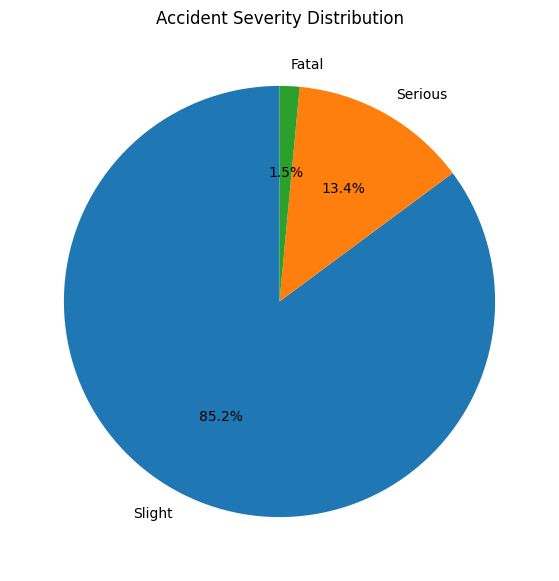

In [144]:
severity_counts = df['Accident_Severity'].value_counts()

plt.pie(severity_counts,
        labels = severity_counts.index,
        autopct = '%1.1f%%',
        startangle = 90)
plt.gcf().set_size_inches(10,7)
plt.title('Accident Severity Distribution')
plt.show()


severity_2019 = df[df['Year'] == 2019]
# severity_2019
sc_2019 = severity_2019['Accident_Severity'].value_counts()

plt.pie(sc_2019,
        labels = sc_2019.index,
        autopct = '%1.1f%%',
        startangle = 90)
plt.gcf().set_size_inches(10,7)
plt.title('Accident Severity Distribution')
plt.show()

<h3>Macclesfield Analysis</h3>
<hr>
<br>
<img src='https://addheat.co.uk/wp-content/uploads/2023/11/macclesfield-swing-bridge.jpeg'>

In [145]:
Macclesfield_df = df[df['District Area'] == 'Macclesfield']

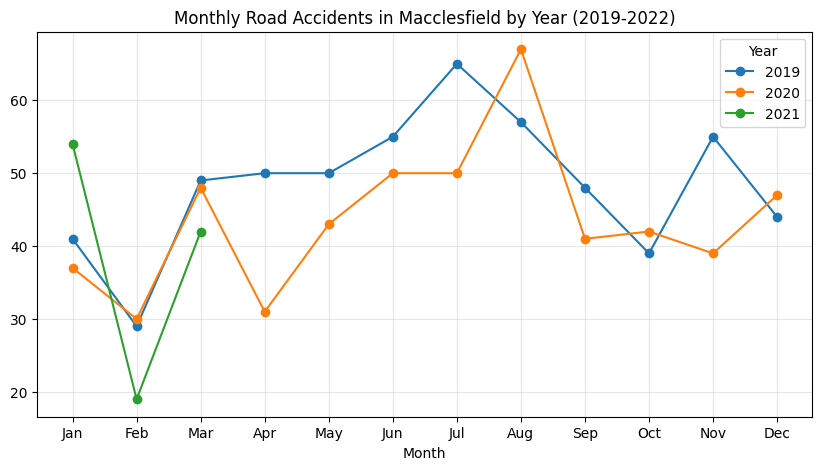

In [146]:
monthly_Macclesfielddata = Macclesfield_df.groupby(['Year', 'Month']).size()

monthly_Macclesfielddata = monthly_Macclesfielddata.unstack(level=0)

monthly_Macclesfielddata.plot(
    marker='o', 
    figsize=(10, 5),
    title='Monthly Road Accidents in Macclesfield by Year (2019-2022)'
)
plt.xticks(range(1, 13), ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
# plt.legend(title='Yearly Accident Comparison', bbox_to_anchor = (1.05,1), loc='upper left')
plt.grid(alpha=0.3)
plt.show()

## Insights: I can see that road accidents in Macclesfield generally range between 20 and 60 per month, with ups and downs across the years 2019 to 2022. The fluctuations show that some months are riskier than others, depending on the year.

2019 This year starts at around 40 in January, then peaks between 50–55 in June and July. After that, the accidents dip back to around 40 in September before slightly rising again to about 45 by December. It shows a mid-year high point with some stability toward the end.

2020 In 2020, the year begins lower at 30 accidents, then climbs sharply, hitting its highest point of more than 60 in August. After this sudden peak, the numbers drop to around 40 by October and settle between 35–40 by the end of the year. This makes 2020 stand out with its unusual August spike.

2021 For 2021, accidents start very low, only 20 in February, but then rise quickly, peaking at 50 in April. The middle of the year stays steady around 40–45, before dipping again to about 30 in December. This year looks more balanced but with a clear early peak.

Overall, I noticed that mid-year months (April–July) often have higher accident counts, while late months like October–December tend to be lower, except for small rises. This makes me think that seasonal factors like weather, holidays, or traffic volume could be influencing the accident trends in Macclesfield.

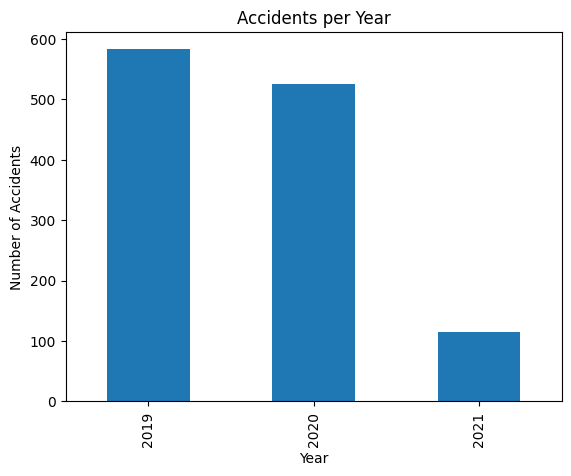

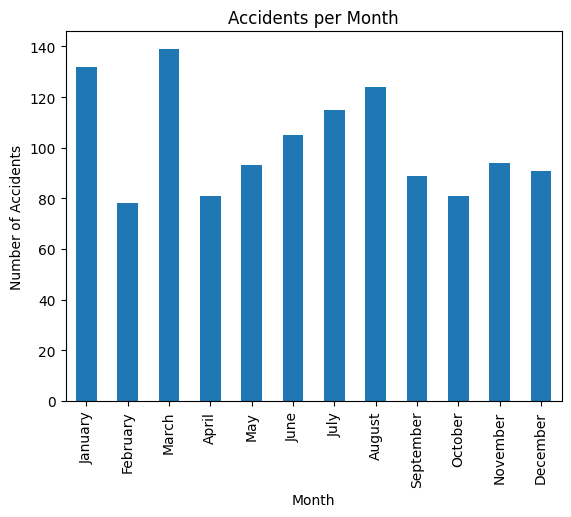

DayOfWeek
Monday       161
Tuesday      162
Wednesday    198
Thursday     187
Friday       166
Saturday     191
Sunday       157
Name: count, dtype: int64


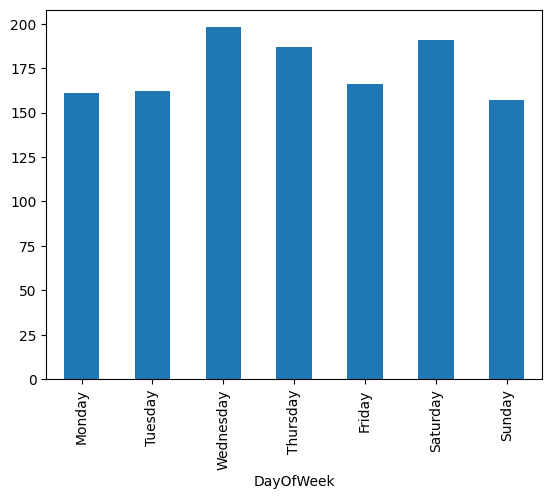

In [147]:
accidents_per_year = Macclesfield_df['Year'].value_counts().sort_index()
accidents_per_month = Macclesfield_df['Month'].value_counts().sort_index()
accidents_per_day = Macclesfield_df['DayOfWeek'].value_counts().sort_index()


#PER YEAR 
accidents_per_year.plot(kind='bar')
plt.title('Accidents per Year')
plt.xlabel('Year')
plt.ylabel('Number of Accidents')
plt.show()

month_names = {
    1: 'January', 2: 'February', 3: 'March', 4: 'April',
    5: 'May', 6: 'June', 7: 'July', 8: 'August',
    9: 'September', 10: 'October', 11: 'November', 12: 'December'
}

# Replace numerical months with their names
accidents_per_month.index = accidents_per_month.index.map(month_names)


accidents_per_month.plot(kind='bar')
plt.title('Accidents per Month')
plt.xlabel('Month')
plt.ylabel('Number of Accidents')
plt.show()


#accident per day
day_names = {
    0: 'Monday',
    1: 'Tuesday',
    2: 'Wednesday',
    3: 'Thursday',
    4: 'Friday',
    5: 'Saturday',
    6: 'Sunday'
}

accidents_per_day.index = accidents_per_day.index.map(day_names)
accidents_per_day.plot(kind='bar')
print(accidents_per_day)

<h3>Tewkesbury Analysis</h3>
<hr>
<br>
<img src='https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQrfW0CLCt-Lk4UQDoRMF-bQAKenBMvV3XmRg&s'>

In [148]:
Tewkesbury_df = df[df['District Area'] == 'Tewkesbury']

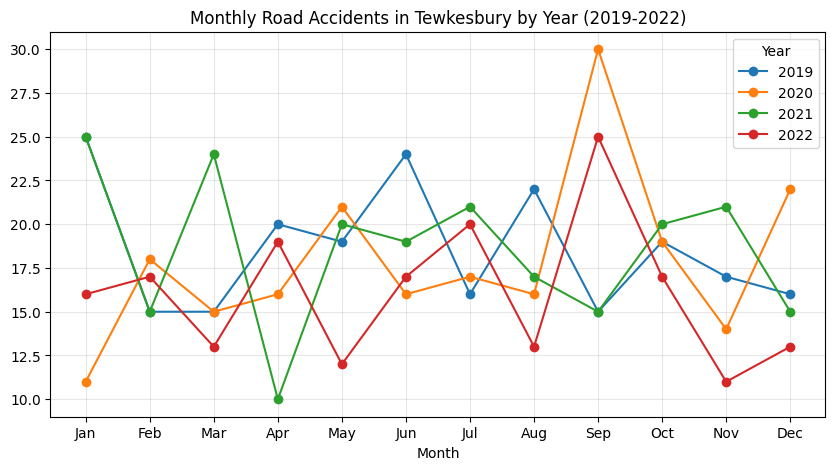

In [149]:
monthly_Tewkesburydata = Tewkesbury_df.groupby(['Year', 'Month']).size()

monthly_Tewkesburydata = monthly_Tewkesburydata.unstack(level=0)

monthly_Tewkesburydata.plot(
    marker='o', 
    figsize=(10, 5),
    title='Monthly Road Accidents in Tewkesbury by Year (2019-2022)'
)
plt.xticks(range(1, 13), ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
# plt.legend(title='Yearly Accident Comparison', bbox_to_anchor = (1.05,1), loc='upper left')
plt.grid(alpha=0.3)
plt.show()

## Insight: I noticed that 2020 had the highest peak in August with around 30 accidents, which might be linked to certain events or conditions during that time. In contrast, 2022 shows more of a decline, reaching its lowest values in November and December with only about 12 to 15 accidents.

When I look at 2019 and 2021, the trends appear steadier, with the numbers mostly moving between 15 and 25 accidents. This makes them look more balanced compared to 2020 and 2022.

Overall, I can see a seasonal pattern, where accidents often rise during the mid-year months (June, August) across most of the years. This suggests that certain seasonal factors like weather, traffic activity, or holiday travel might be influencing the accident rates.

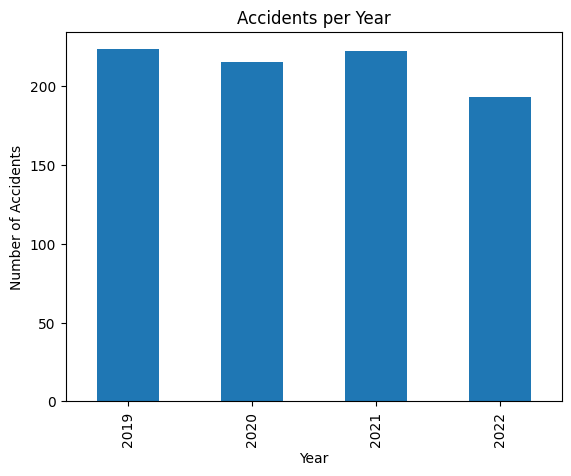

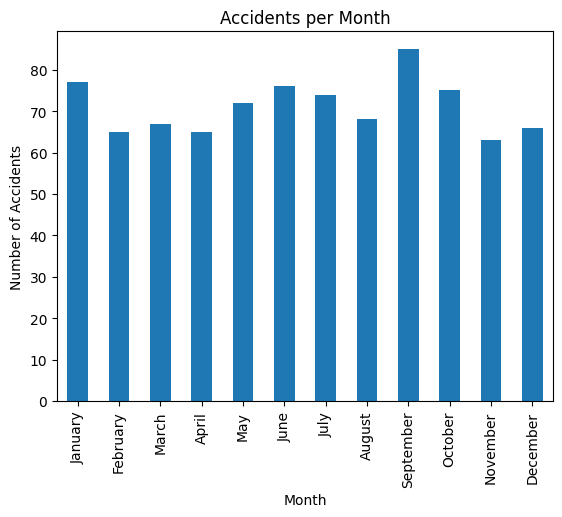

DayOfWeek
Monday        99
Tuesday      110
Wednesday    133
Thursday     133
Friday       133
Saturday     128
Sunday       117
Name: count, dtype: int64


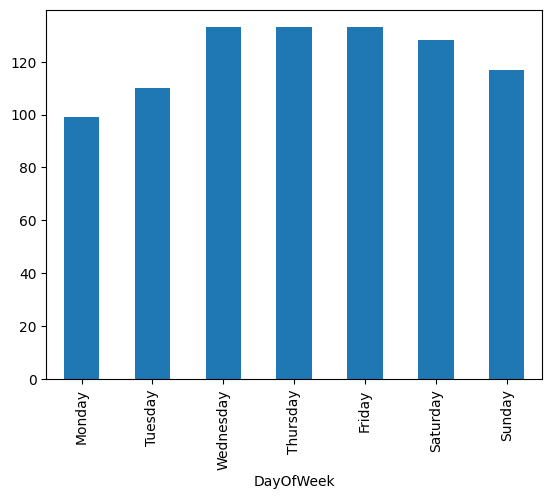

In [150]:
accidents_per_year = Tewkesbury_df['Year'].value_counts().sort_index()
accidents_per_month = Tewkesbury_df['Month'].value_counts().sort_index()
accidents_per_day = Tewkesbury_df['DayOfWeek'].value_counts().sort_index()


#PER YEAR 
accidents_per_year.plot(kind='bar')
plt.title('Accidents per Year')
plt.xlabel('Year')
plt.ylabel('Number of Accidents')
plt.show()

month_names = {
    1: 'January', 2: 'February', 3: 'March', 4: 'April',
    5: 'May', 6: 'June', 7: 'July', 8: 'August',
    9: 'September', 10: 'October', 11: 'November', 12: 'December'
}

# Replace numerical months with their names
accidents_per_month.index = accidents_per_month.index.map(month_names)


accidents_per_month.plot(kind='bar')
plt.title('Accidents per Month')
plt.xlabel('Month')
plt.ylabel('Number of Accidents')
plt.show()


#accident per day
day_names = {
    0: 'Monday',
    1: 'Tuesday',
    2: 'Wednesday',
    3: 'Thursday',
    4: 'Friday',
    5: 'Saturday',
    6: 'Sunday'
}

accidents_per_day.index = accidents_per_day.index.map(day_names)
accidents_per_day.plot(kind='bar')
print(accidents_per_day)

## Insights: I noticed that the number of accidents was highest in 2019 and 2020 (around 200 each). In 2021, the numbers became slightly lower, and by 2022 they went down further to about 150. This shows a possible downward trend over the years.

Accidents per Month
Looking at the months, the highest accident count is in one month with about 80 incidents, while the other months stay lower and more consistent, usually around 20 to 40. This means only certain months stand out as more risky compared to the rest.

Accidents per Day of Week
I also noticed that accidents are most common on Wednesday and Thursday (around 130 to 133), while Sunday has the lowest count (around 117). This suggests that midweek days are more dangerous, probably because of heavier traffic or work-related travel during those times.